In [46]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
import xgboost as xgb
from sklearn.metrics import auc, accuracy_score, confusion_matrix, f1_score, roc_auc_score, classification_report, ConfusionMatrixDisplay, precision_recall_curve, RocCurveDisplay
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from xgboost import plot_importance
import matplotlib.pyplot as plt
import seaborn as sn
import warnings
import pickle
import plotly.express as px
warnings.filterwarnings('ignore')
%matplotlib inline

## Constants

In [47]:
columns_continuous = ['BMI','GenHlth','MentHlth','PhysHlth','Age','Education','Income']
columns_standard = ['BMI','MentHlth','PhysHlth']
columns_minmax = ['Age','Education','Income']
columns_binary = ['HighBP','HighChol','CholCheck', 'Smoker','Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump','AnyHealthcare'
                       ,'NoDocbcCost','DiffWalk','Sex']

In [48]:
# A grid search parameter grid for XGBoost
param_dist_grid = {
    'n_estimators': np.array([50,150]),  
    'max_depth': np.array([5,10,15]),
    'learning_rate': np.array([0.01,0.05]),
    'gamma': np.array([1,3,5])
}

# 1. Dataset, Multiclass

In [49]:
df = pd.read_csv("diabetes_012_health_indicators_BRFSS2015.csv")
print("First rows of the dataset:")
print(df.head())

column_names = df.columns
print("Column names:")


First rows of the dataset:
   Diabetes_012  HighBP  HighChol  CholCheck   BMI  Smoker  Stroke  \
0           0.0     1.0       1.0        1.0  40.0     1.0     0.0   
1           0.0     0.0       0.0        0.0  25.0     1.0     0.0   
2           0.0     1.0       1.0        1.0  28.0     0.0     0.0   
3           0.0     1.0       0.0        1.0  27.0     0.0     0.0   
4           0.0     1.0       1.0        1.0  24.0     0.0     0.0   

   HeartDiseaseorAttack  PhysActivity  Fruits  ...  AnyHealthcare  \
0                   0.0           0.0     0.0  ...            1.0   
1                   0.0           1.0     0.0  ...            0.0   
2                   0.0           0.0     1.0  ...            1.0   
3                   0.0           1.0     1.0  ...            1.0   
4                   0.0           1.0     1.0  ...            1.0   

   NoDocbcCost  GenHlth  MentHlth  PhysHlth  DiffWalk  Sex   Age  Education  \
0          0.0      5.0      18.0      15.0       1.0  0.0

In [ ]:
df.isna().sum()

In [12]:
# df = pd.get_dummies(data=df, columns=['GenHlth'])
# print(df.head())

In [50]:
y = df['Diabetes_012']
X = df.drop(columns=['Diabetes_012'])

In [51]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state=42)

print(X_train.shape)
print(X_test.shape)

(202944, 21)
(50736, 21)


In [52]:
mms = MinMaxScaler()
X_train[columns_minmax] = mms.fit_transform(X_train[columns_minmax])
X_test[columns_minmax] = mms.transform(X_test[columns_minmax])

ss = StandardScaler()
X_train[columns_standard] = ss.fit_transform(X_train[columns_standard])
X_test[columns_standard] = ss.transform(X_test[columns_standard])

In [53]:
X_train = X_train.to_numpy()
X_test = X_test.to_numpy()

y_train = y_train.to_numpy()
y_test = y_test.to_numpy()

## GridSearch CV

In [98]:
xgb_model_grid = xgb.XGBClassifier(tree_method="hist",random_state=42)
grid_search = GridSearchCV( xgb_model_grid , cv=5, param_grid=param_dist_grid, scoring='f1_weighted')

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'gamma': array([1, 3, 5]),
                         'learning_rate': array([0.01, 0.05]),
                         'max_depth': array([ 5, 10, 15]),
                         'n_estimators': array([ 50, 150])},
             scoring='f1_weighted')

In [99]:
print("\n The best score across ALL searched params:\n",grid_search.best_score_)
print("\n The best parameters across ALL searched params:\n",grid_search.best_params_)


 The best score across ALL searched params:
 0.8124505759012548

 The best parameters across ALL searched params:
 {'gamma': 1, 'learning_rate': 0.05, 'max_depth': 15, 'n_estimators': 150}


## Randomized Search CV

In [66]:
xgb_classifier = xgb.XGBClassifier(random_state = 42)

param_dist_randomized = {
    'n_estimators': np.random.randint(50, 1000, 5),  
    'max_depth': np.random.randint(1, 20, 5), 
    'learning_rate': np.random.uniform(0.01, 0.1, 5),
    'gamma': np.random.uniform(0,10,4),
    'subsample': np.random.uniform(0, 1, 3),
    'colsample_bytree': np.random.uniform(0, 1, 3)
}

random_search = RandomizedSearchCV(
    xgb_classifier,
    param_distributions=param_dist_randomized,
    n_iter=5,
    cv=5,
    scoring='f1_weighted' 
)
# random_state=42

random_search.fit(X_train[:50000,:], y_train[:50000])
print("Best parameters: ", random_search.best_params_)
best_model = random_search.best_estimator_
y_pred = best_model.predict(X_test)
f1 = f1_score(y_test, y_pred, average="weighted")
print("F1-score on test set: ", f1)

Best parameters:  {'subsample': 0.6907443534699234, 'n_estimators': 837, 'max_depth': 8, 'learning_rate': 0.08228422685398566, 'gamma': 7.625429942309385, 'colsample_bytree': 0.585362472027185}
F1-score on test set:  0.81028035595054


## XGB Classifier

In [69]:
xgb_model = xgb.XGBClassifier( random_state=42, 
                              subsample =  0.17464383537522654, n_estimators = 751, max_depth = 8, learning_rate = 0.08705332861042284, gamma = 4.4607891960562736, colsample_bytree = 0.9740650745197952)
# xgb_model.set_params(**random_search.best_params_)
# xgb_model.set_params(**grid_search.best_params_)

xgb_model.fit(X_train, y_train)

y_pred = xgb_model.predict(X_test)

In [ ]:
with open('threeclass_xgb', 'wb') as file:
    pickle.dump(xgb_model, file)

In [70]:
print('confusion matrix')
print(confusion_matrix(y_test, y_pred))
print('F1 weighted')
print(f1_score(y_test, y_pred, average='weighted'))
print('accuracy score')
print(accuracy_score(y_test,y_pred))
print('roc auc score')
print(roc_auc_score(y_test,xgb_model.predict_proba(X_test),multi_class='ovr'))

confusion matrix
[[41696     0  1045]
 [  828     0    98]
 [ 5684     0  1385]]
F1 weighted
0.8126373106438426
accuracy score
0.8491209397666352
roc auc score
0.7890934704148919


In [71]:
print(classification_report(y_pred, y_test))

              precision    recall  f1-score   support

         0.0       0.98      0.86      0.92     48208
         1.0       0.00      0.00      0.00         0
         2.0       0.20      0.55      0.29      2528

    accuracy                           0.85     50736
   macro avg       0.39      0.47      0.40     50736
weighted avg       0.94      0.85      0.89     50736



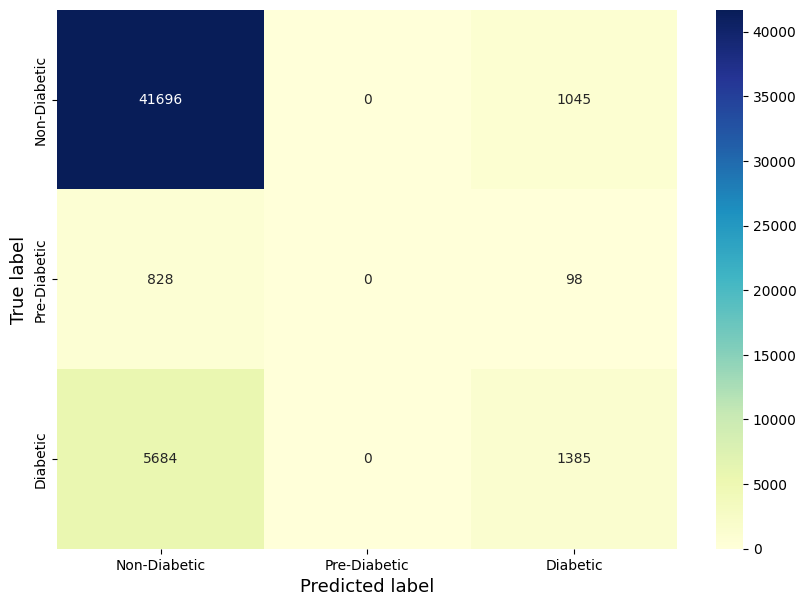

In [72]:
cm_df = pd.DataFrame(confusion_matrix(y_test, y_pred), index = [i for i in ['Non-Diabetic', 'Pre-Diabetic', 'Diabetic']], columns = [i for i in ['Non-Diabetic', 'Pre-Diabetic', 'Diabetic']])
plt.figure(figsize = (10,7))
sn.heatmap(cm_df, cmap="YlGnBu", annot=True, fmt='g')
plt.xlabel('Predicted label',fontsize = 13)
plt.ylabel('True label',fontsize = 13)
plt.show()

## Feature Ranking

In [73]:
print(xgb_model.feature_importances_)
feature_importance = xgb_model.feature_importances_
feature_importance_order = np.flip(np.argsort(feature_importance))
print(feature_importance_order)

[0.41340828 0.05098582 0.02541904 0.03977429 0.01867981 0.02118951
 0.02603335 0.01842863 0.01863645 0.01832458 0.02532509 0.01782305
 0.01880001 0.11582538 0.01842545 0.01875427 0.03703306 0.02150884
 0.03328188 0.01944823 0.02289502]
[ 0 13  1  3 16 18  6  2 10 20 17  5 19 12 15  4  8  7 14  9 11]


In [74]:
column_names = df.drop(columns=['Diabetes_012']).columns
print(column_names[feature_importance_order[:5]])

Index(['HighBP', 'GenHlth', 'HighChol', 'BMI', 'DiffWalk'], dtype='object')


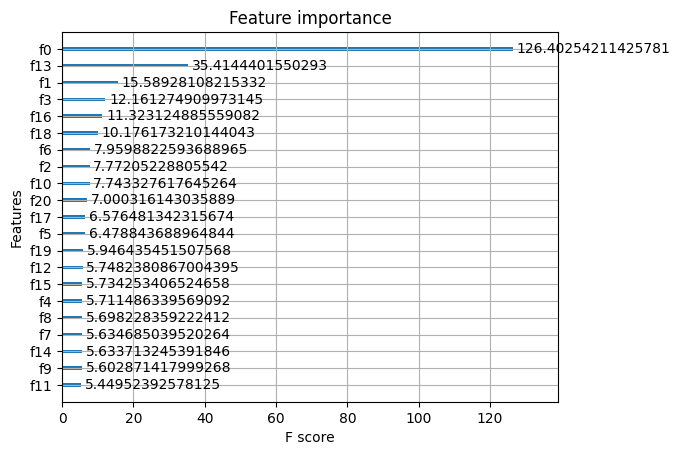

In [75]:
plot_importance(xgb_model,importance_type = 'gain')
# plt.yticks(column_names)
plt.show()

In [76]:
X_train_ranked = X_train[:,feature_importance_order[:5]]
X_test_ranked = X_test[:,feature_importance_order[:5]]
print(X_train_ranked.shape)
print(X_test_ranked.shape)

(202944, 5)
(50736, 5)


In [77]:
xgb_model_ranked = xgb.XGBClassifier(random_state=42, 
                              subsample =  0.17464383537522654, n_estimators = 751, max_depth = 8, learning_rate = 0.08705332861042284, gamma = 4.4607891960562736, colsample_bytree = 0.9740650745197952)

xgb_model_ranked.fit(X_train_ranked, y_train)

y_pred_ranked = xgb_model_ranked.predict(X_test_ranked)

In [78]:
print('confusion matrix')
print(confusion_matrix(y_test, y_pred_ranked))
print('F1 Score')
print(f1_score(y_test, y_pred_ranked,average='weighted'))
print('accuracy score')
print(accuracy_score(y_test,y_pred_ranked))
print('roc auc score')
print(roc_auc_score(y_test,xgb_model_ranked.predict_proba(X_test_ranked),multi_class='ovr'))

confusion matrix
[[41886     0   855]
 [  847     0    79]
 [ 5944     0  1125]]
F1 Score
0.806305290267732
accuracy score
0.8477412488174078
roc auc score
0.76489012482738


In [79]:
print(classification_report(y_pred_ranked, y_test))

              precision    recall  f1-score   support

         0.0       0.98      0.86      0.92     48677
         1.0       0.00      0.00      0.00         0
         2.0       0.16      0.55      0.25      2059

    accuracy                           0.85     50736
   macro avg       0.38      0.47      0.39     50736
weighted avg       0.95      0.85      0.89     50736



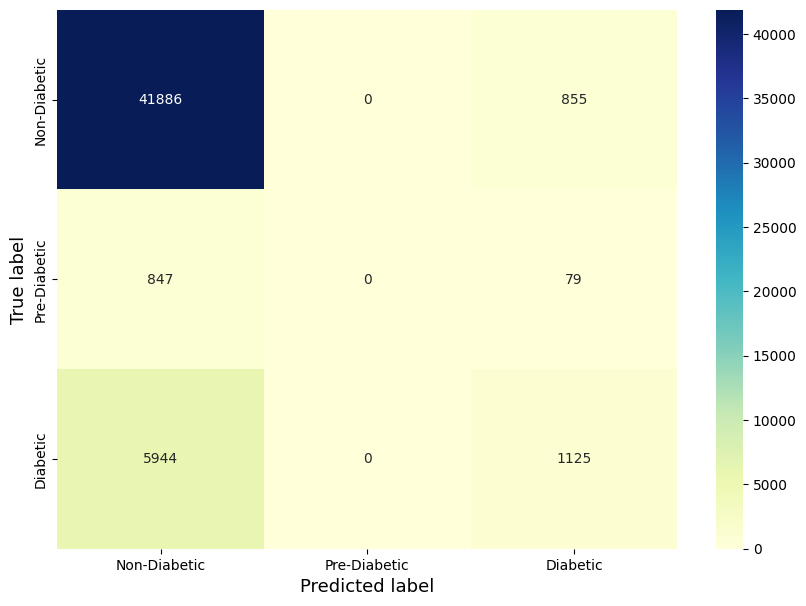

In [80]:
cm_df = pd.DataFrame(confusion_matrix(y_test, y_pred_ranked), index = [i for i in ['Non-Diabetic', 'Pre-Diabetic', 'Diabetic']], columns = [i for i in ['Non-Diabetic', 'Pre-Diabetic', 'Diabetic']])
plt.figure(figsize = (10,7))
sn.heatmap(cm_df, cmap="YlGnBu", annot=True, fmt='g')
plt.xlabel('Predicted label',fontsize = 13)
plt.ylabel('True label',fontsize = 13)
plt.show()

## Grid Search For Accuracy

In [46]:
xgb_model_grid = xgb.XGBClassifier(tree_method="hist",random_state=42)
grid_search = GridSearchCV( xgb_model_grid , cv=5, param_grid=param_dist_grid, scoring='accuracy')

grid_search.fit(X_train, y_train)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'gamma': array([1, 3, 5]),
                         'learning_rate': array([0.01, 0.05]),
                         'max_depth': array([ 5, 10, 15]),
                         'n_estimators': array([ 50, 150])},
             scoring='accuracy')

In [47]:
print("\n The best score across ALL searched params:\n",grid_search.best_score_)
print("\n The best parameters across ALL searched params:\n",grid_search.best_params_)


 The best score across ALL searched params:
 0.8495989020041961

 The best parameters across ALL searched params:
 {'gamma': 1, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 150}


# 2. Dataset, Binary 50-50 Data

In [81]:
df_binary_50_50 = pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")
# print("First rows of the dataset:")
# print(df_binary_50_50.head())

# column_names = df_binary_50_50.columns
# print("Column names:")

# df_binary_50_50 = pd.get_dummies(data=df_binary_50_50, columns=['GenHlth'])

y_binary_50_50 = df_binary_50_50['Diabetes_binary']
X_binary_50_50 = df_binary_50_50.drop(columns=['Diabetes_binary'])

X_train_binary_50_50, X_test_binary_50_50, y_train_binary_50_50, y_test_binary_50_50 = train_test_split(X_binary_50_50, y_binary_50_50,stratify=y_binary_50_50, test_size = 0.2, random_state=42)

print(X_train_binary_50_50.shape)
print(X_test_binary_50_50.shape)
print(y_test_binary_50_50.shape)
print(sum(y_test_binary_50_50)/y_test_binary_50_50.shape[0])

(56553, 21)
(14139, 21)
(14139,)
0.49996463682014286


In [82]:
mms = MinMaxScaler()
X_train_binary_50_50[columns_minmax] = mms.fit_transform(X_train_binary_50_50[columns_minmax])
X_test_binary_50_50[columns_minmax] = mms.transform(X_test_binary_50_50[columns_minmax])

ss = StandardScaler()
X_train_binary_50_50[columns_standard] = ss.fit_transform(X_train_binary_50_50[columns_standard])
X_test_binary_50_50[columns_standard] = ss.transform(X_test_binary_50_50[columns_standard])

In [83]:
X_train_binary_50_50 = X_train_binary_50_50.to_numpy()
X_test_binary_50_50 = X_test_binary_50_50.to_numpy()

y_train_binary_50_50 = y_train_binary_50_50.to_numpy()
y_test_binary_50_50 = y_test_binary_50_50.to_numpy()

## GridSearch CV

In [57]:
xgb_model_grid_binary_50_50 = xgb.XGBClassifier(random_state=42)
grid_search_binary_50_50 = GridSearchCV(xgb_model_grid_binary_50_50 , cv=5, param_grid=param_dist_grid, scoring='f1')

grid_search_binary_50_50.fit(X_train_binary_50_50, y_train_binary_50_50)

GridSearchCV(cv=5,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None, device=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     grow_policy=None, importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None,...
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     multi_strategy=None, n_estimators=None,
                                     n_jobs=None, num_parallel_tree=None,
                                     random_state=42, ...),
             param_grid={'gamma': array([1, 3, 5]),
                         'learning_rate': array([0.01, 0.05]),
                         'max_depth': array([ 5, 10, 15]),
                         'n_estimators': array([ 50, 150])},
             scoring='accuracy')

In [58]:
print("\n The best score across ALL searched params:\n",grid_search_binary_50_50.best_score_)
print("\n The best parameters across ALL searched params:\n",grid_search_binary_50_50.best_params_)


 The best score across ALL searched params:
 0.7531695982901553

 The best parameters across ALL searched params:
 {'gamma': 1, 'learning_rate': 0.05, 'max_depth': 5, 'n_estimators': 150}


## Randomized Search CV

In [42]:
xgb_classifier_binary_50_50 = xgb.XGBClassifier()

param_dist_randomized_50 = {
    'n_estimators': np.random.randint(50, 1000, 5),  
    'max_depth': np.random.randint(1, 20, 5), 
    'learning_rate': np.random.uniform(0.01, 0.1, 5),
    'gamma': np.random.uniform(0,10,4),
    'subsample': np.random.uniform(0, 1, 3),
}

random_search_binary_50 = RandomizedSearchCV(
    xgb_classifier_binary_50_50,
    param_distributions=param_dist_randomized_50,
    n_iter=5,
    cv=5,
    scoring='f1'
)

random_search_binary_50.fit(X_train_binary_50_50, y_train_binary_50_50)
print("Best parameters: ", random_search_binary_50.best_params_)
best_model = random_search_binary_50.best_estimator_
y_pred_binary_50_50 = best_model.predict(X_test_binary_50_50)
f1 = f1_score(y_test_binary_50_50, y_pred_binary_50_50)
print("F1-score on test set: ", f1)

Best parameters:  {'subsample': 0.21778615757274244, 'n_estimators': 510, 'max_depth': 4, 'learning_rate': 0.04231980922807369, 'gamma': 6.469308197311535}
F1-score on test set:  0.76509702809065


## XGB Classifier

In [84]:
xgb_model_binary_50_50 = xgb.XGBClassifier(random_state=42,
                                            subsample = 0.2757584755338077, n_estimators = 396, max_depth = 5, learning_rate = 0.036643581017826526, gamma = 4.75414396998711)

# xgb_model_binary_50_50.set_params(**random_search_binary_50.best_params_)
# xgb_model_binary_50_50.set_params(**grid_search_binary_50_50.best_params_)

xgb_model_binary_50_50.fit(X_train_binary_50_50, y_train_binary_50_50)

y_pred_binary_50_50 = xgb_model_binary_50_50.predict(X_test_binary_50_50)

In [85]:
print('confusion matrix')
print(confusion_matrix(y_test_binary_50_50, y_pred_binary_50_50))
print('F1')
print(f1_score(y_test_binary_50_50, y_pred_binary_50_50))
print('accuracy score')
print(accuracy_score(y_test_binary_50_50,y_pred_binary_50_50))
print('roc auc score')
print(roc_auc_score(y_test_binary_50_50,xgb_model_binary_50_50.predict_proba(X_test_binary_50_50)[:,1]))

confusion matrix
[[4992 2078]
 [1417 5652]]
F1
0.7638353942833975
accuracy score
0.7528113727986421
roc auc score
0.8309123965566332


In [86]:
print(classification_report(y_pred_binary_50_50, y_test_binary_50_50))

              precision    recall  f1-score   support

           0       0.71      0.78      0.74      6409
           1       0.80      0.73      0.76      7730

    accuracy                           0.75     14139
   macro avg       0.75      0.76      0.75     14139
weighted avg       0.76      0.75      0.75     14139



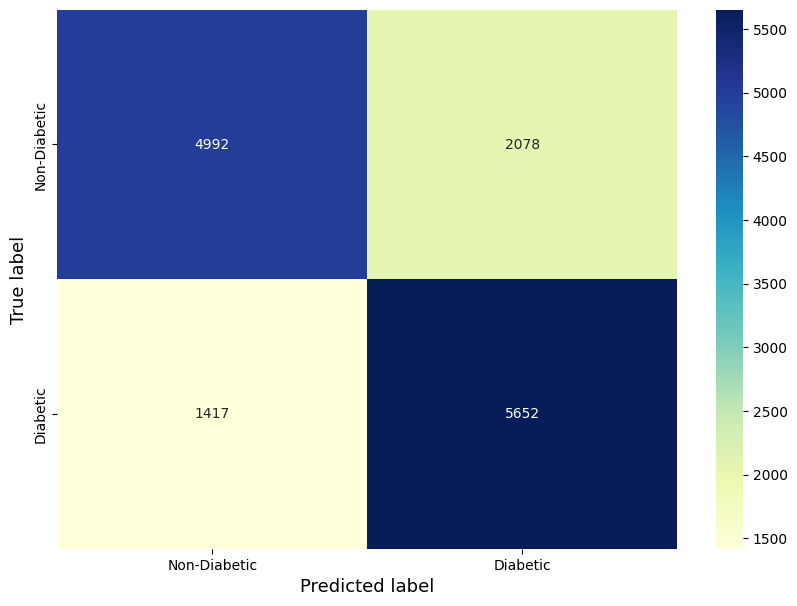

In [87]:
cm_df = pd.DataFrame(confusion_matrix(y_test_binary_50_50, y_pred_binary_50_50), index = [i for i in ['Non-Diabetic', 'Diabetic']], columns = [i for i in ['Non-Diabetic', 'Diabetic']])
plt.figure(figsize = (10,7))
sn.heatmap(cm_df, cmap="YlGnBu", annot=True,  fmt='g')
plt.xlabel('Predicted label',fontsize = 13)
plt.ylabel('True label',fontsize = 13)
plt.show()

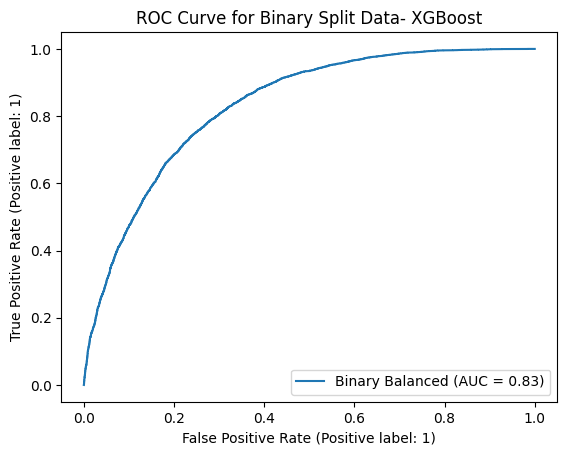

In [88]:
disp = RocCurveDisplay.from_estimator(xgb_model_binary_50_50, X_test_binary_50_50, y_test_binary_50_50, name='Binary Balanced')
plt.title('ROC Curve for Binary Split Data- XGBoost')
plt.show()

## Feature Ranking

In [89]:
print(xgb_model_binary_50_50.feature_importances_)
feature_importance = xgb_model_binary_50_50.feature_importances_
feature_importance_order = np.flip(np.argsort(feature_importance))
print(feature_importance_order)

[0.4476233  0.04911836 0.02645704 0.03476295 0.01243515 0.01657939
 0.02684861 0.01454333 0.01239681 0.0122835  0.02378144 0.01189287
 0.01449712 0.14840575 0.01373711 0.0135162  0.03081448 0.01939102
 0.0382144  0.01363608 0.01906499]
[ 0 13  1 18  3 16  6  2 10 17 20  5  7 12 14 19 15  4  8  9 11]


In [90]:
print(column_names[feature_importance_order[:5]])

Index(['HighBP', 'GenHlth', 'HighChol', 'Age', 'BMI'], dtype='object')


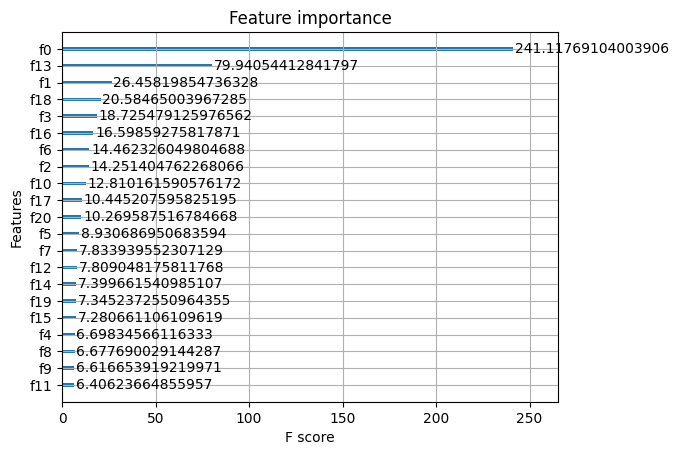

In [91]:
plot_importance(xgb_model_binary_50_50,importance_type = 'gain')
# plt.yticks(column_names)
plt.show()

In [92]:
X_train_binary_50_50_ranked = X_train_binary_50_50[:,feature_importance_order[:5]]
X_test_binary_50_50_ranked = X_test_binary_50_50[:,feature_importance_order[:5]]
print(X_train_binary_50_50_ranked.shape)
print(X_test_binary_50_50_ranked.shape)

(56553, 5)
(14139, 5)


In [93]:
xgb_model_binary_50_50_ranked = xgb.XGBClassifier(random_state=42, 
                              subsample = 0.2757584755338077, n_estimators = 396, max_depth = 5, learning_rate = 0.036643581017826526, gamma = 4.75414396998711)

xgb_model_binary_50_50_ranked.fit(X_train_binary_50_50_ranked, y_train_binary_50_50)

y_pred_binary_ranked_50_50 = xgb_model_binary_50_50_ranked.predict(X_test_binary_50_50_ranked)

In [94]:
print('confusion matrix')
print(confusion_matrix(y_test_binary_50_50, y_pred_binary_ranked_50_50))
print('F1 Score')
print(f1_score(y_test_binary_50_50, y_pred_binary_ranked_50_50))
print('accuracy score')
print(accuracy_score(y_test_binary_50_50,y_pred_binary_ranked_50_50))
print('roc auc score')
print(roc_auc_score(y_test_binary_50_50,xgb_model_binary_50_50_ranked.predict_proba(X_test_binary_50_50_ranked)[:,1]))

confusion matrix
[[4925 2145]
 [1477 5592]]
F1 Score
0.7553694448196676
accuracy score
0.7438291251149304
roc auc score
0.8223048499704768


In [95]:
print(classification_report(y_pred_binary_ranked_50_50, y_test_binary_50_50))

              precision    recall  f1-score   support

           0       0.70      0.77      0.73      6402
           1       0.79      0.72      0.76      7737

    accuracy                           0.74     14139
   macro avg       0.74      0.75      0.74     14139
weighted avg       0.75      0.74      0.74     14139



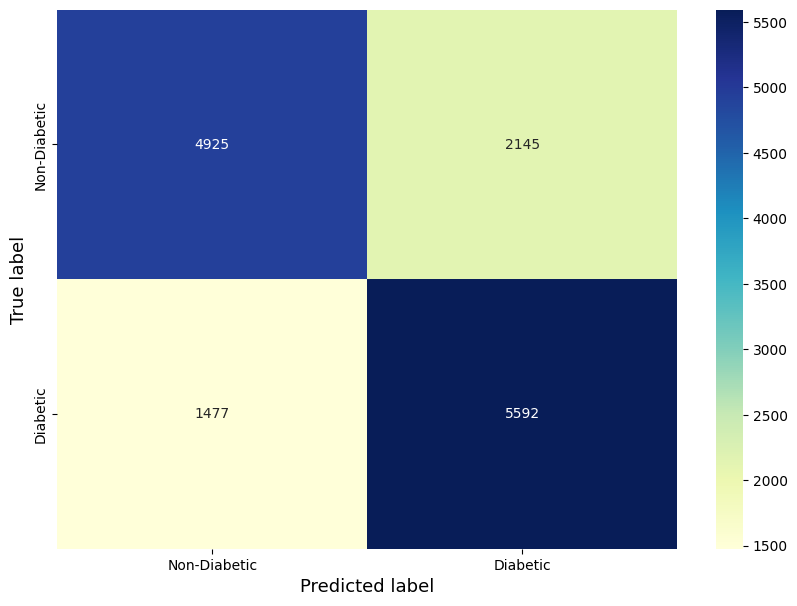

In [96]:
cm_df = pd.DataFrame(confusion_matrix(y_test_binary_50_50, y_pred_binary_ranked_50_50), index = [i for i in ['Non-Diabetic', 'Diabetic']], columns = [i for i in ['Non-Diabetic', 'Diabetic']])
plt.figure(figsize = (10,7))
sn.heatmap(cm_df, cmap="YlGnBu", annot=True,  fmt='g')
plt.xlabel('Predicted label',fontsize = 13)
plt.ylabel('True label',fontsize = 13)
plt.show()

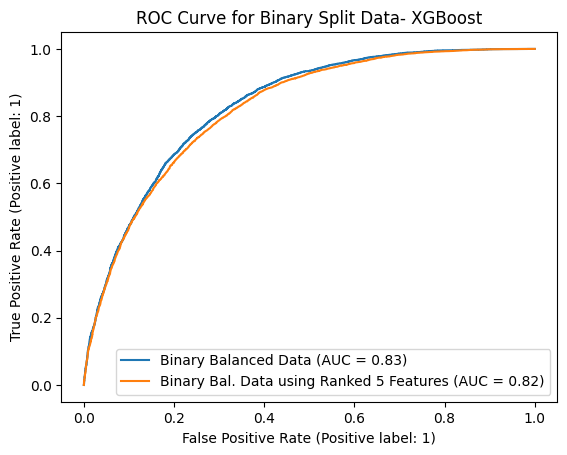

In [97]:
disp = RocCurveDisplay.from_estimator(xgb_model_binary_50_50, X_test_binary_50_50, y_test_binary_50_50, name='Binary Balanced Data')
RocCurveDisplay.from_estimator(xgb_model_binary_50_50_ranked, X_test_binary_50_50_ranked, y_test_binary_50_50,ax=disp.ax_, name='Binary Bal. Data using Ranked 5 Features')
plt.title('ROC Curve for Binary Split Data- XGBoost')
plt.show()

# Exploratory Data Analysis

In [ ]:
raw_df_binary = pd.read_csv("diabetes_binary_5050split_health_indicators_BRFSS2015.csv")

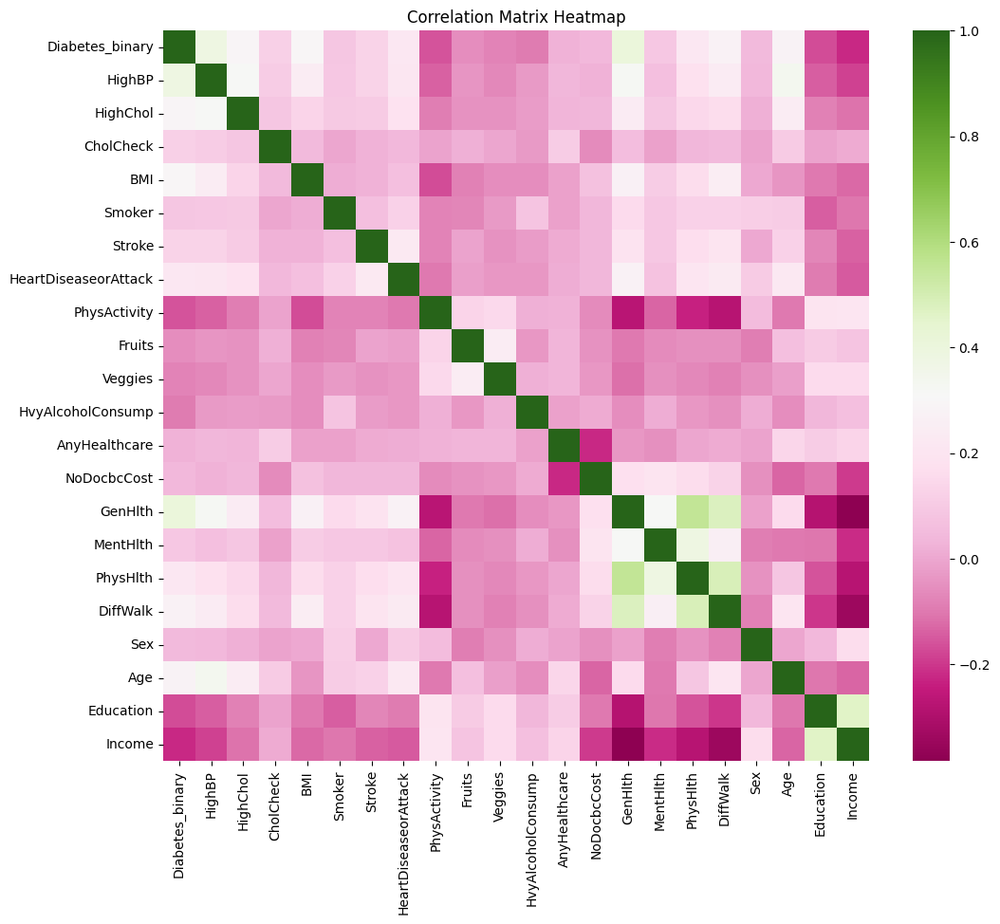

In [ ]:
corr_matrix = raw_df_binary.corr()
# Visualize relationship between all variables
plt.figure(figsize=(12,10))
sn.heatmap(data=corr_matrix, cmap='PiYG')
plt.title('Correlation Matrix Heatmap')
plt.show()

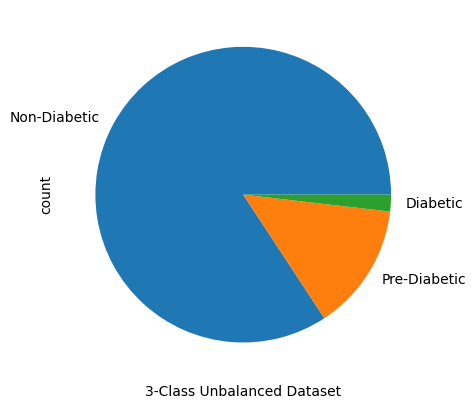

In [ ]:
labels = ['Non-Diabetic', 'Pre-Diabetic','Diabetic']
raw_df["Diabetes_012"].value_counts().plot(kind="pie", labels = labels)
plt.xlabel('3-Class Unbalanced Dataset')
plt.show()

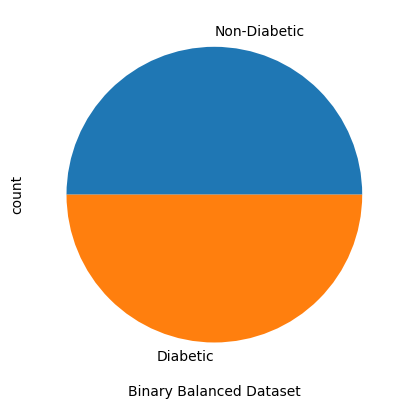

In [ ]:
labels = ['Non-Diabetic', 'Diabetic']
raw_df_binary["Diabetes_binary"].value_counts().plot(kind="pie", labels = labels)
plt.xlabel('Binary Balanced Dataset')
plt.show()

<Axes: xlabel='HighBP', ylabel='count'>

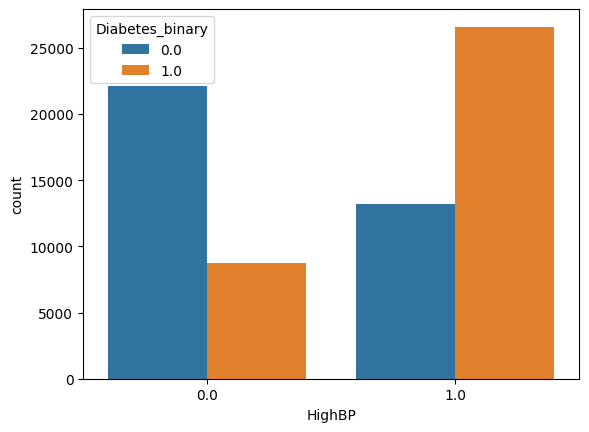

In [ ]:
sn.countplot(x='HighBP',hue="Diabetes_binary",data=raw_df_binary)

<Axes: xlabel='HighChol', ylabel='count'>

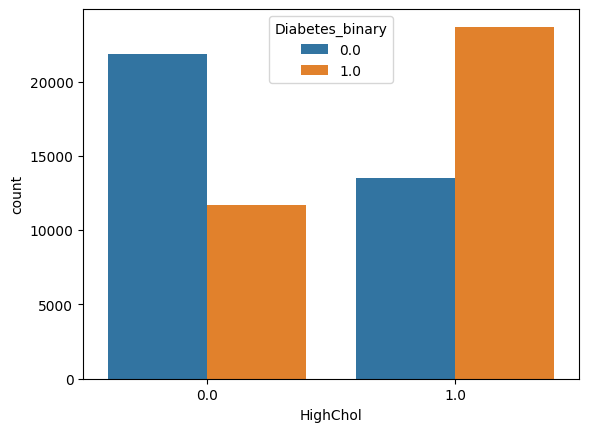

In [ ]:
sn.countplot(x='HighChol',hue="Diabetes_binary",data=raw_df_binary)

HighChol 1 means there is high cholesterol

<Axes: xlabel='GenHlth', ylabel='count'>

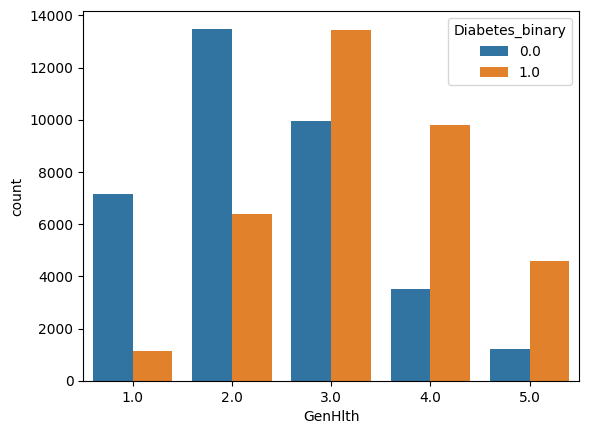

In [ ]:
sn.countplot(x='GenHlth',hue="Diabetes_binary",data=raw_df_binary)

General health condition 1 is excellent, 5 is poor. 

In [ ]:
px.histogram(raw_df_binary,
             x='BMI',
             title='Relation Between BMI & Diabetes',
             color='Diabetes_binary')

From above histogram, we can conclude that increasing BMI, above 25-26, increases the risk of diabetes.

In [ ]:
px.histogram(raw_df_binary,x='Age',title='Age Vs Diabetes', color='Diabetes_binary')

Based on the graph presented, we can deduce that there is a greater volume of data available for age groups 6 to 11. Additionally, individuals within these age (especially higher ages) brackets exhibit a higher susceptibility to diabetes. Therefore, age emerges as a critical feature in our predictive analyses.

<Axes: xlabel='DiffWalk', ylabel='count'>

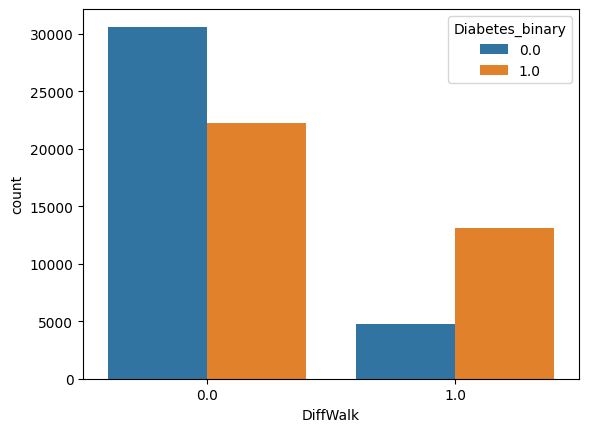

In [ ]:
sn.countplot(x='DiffWalk',hue="Diabetes_binary",data=raw_df_binary)

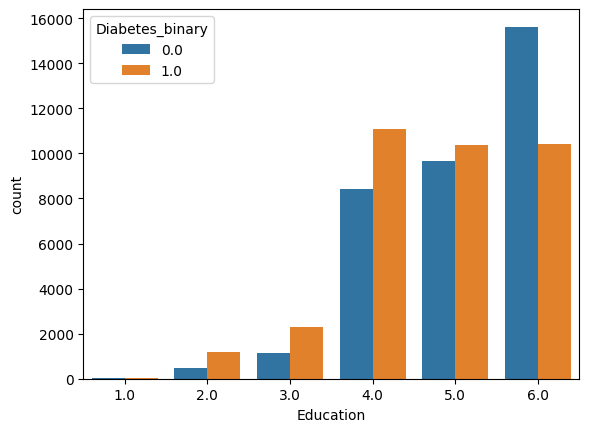

In [ ]:
sn.countplot(x='Education',hue="Diabetes_binary",data=raw_df_binary);

<Axes: xlabel='Income', ylabel='count'>

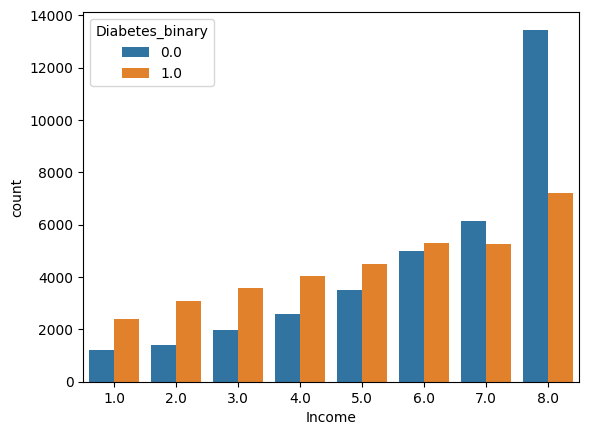

In [ ]:
sn.countplot(x='Income',hue='Diabetes_binary',data=raw_df_binary)

In [ ]:
px.histogram(raw_df_binary,x='PhysHlth',title='PhysHlth Vs Diabetes', color='Diabetes_binary')

## Unbalanced data

In [ ]:
raw_df = pd.read_csv("diabetes_012_health_indicators_BRFSS2015.csv")

In [ ]:
px.histogram(raw_df,x='Age',title='Age Vs Diabetes', color='Diabetes_012')

In [ ]:
px.histogram(raw_df,x='BMI',title='BMI Vs Diabetes', color='Diabetes_012')

<Axes: xlabel='Education', ylabel='count'>

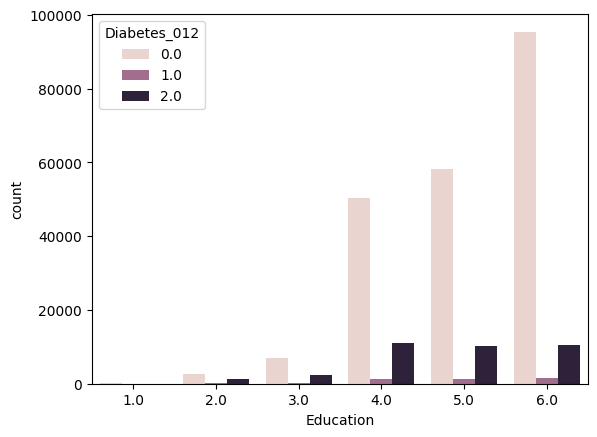

In [ ]:
sn.countplot(x='Education',hue='Diabetes_012',data=raw_df)

<Axes: xlabel='Income', ylabel='count'>

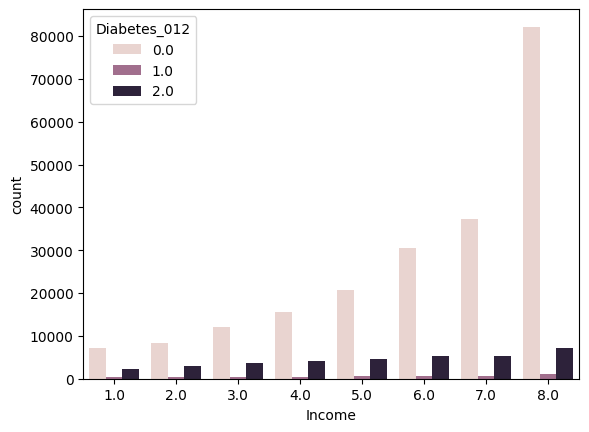

In [ ]:
sn.countplot(x='Income',hue='Diabetes_012',data=raw_df)

<Axes: xlabel='HighBP', ylabel='count'>

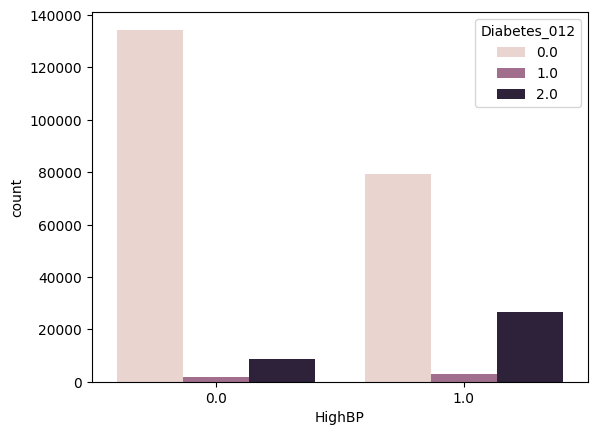

In [ ]:
sn.countplot(x='HighBP',hue='Diabetes_012',data=raw_df)